In [1]:
import os
os.environ["TQDM_DISABLE"] = "1"

import tqdm
from tqdm import tqdm as tqdm_class

_original_init = tqdm_class.__init__
def _patched_init(self, *args, **kwargs):
    kwargs["disable"] = True
    _original_init(self, *args, **kwargs)
tqdm_class.__init__ = _patched_init
tqdm.tqdm = tqdm_class

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import warnings
import sys
import time
import logging
logging.getLogger("anomalib").setLevel(logging.ERROR)
warnings.filterwarnings('ignore')

from tqdm import tqdm
from pathlib import Path
from collections import Counter, defaultdict
from PIL import Image

In [2]:
try:
    import google.colab
    from google.colab import drive
    !uv pip install anomalib
    !uv pip install open-clip-torch
    drive.mount('/content/drive', force_remount=True)
    PROJECT_ROOT = Path('/content/drive/Othercomputers/Mac/multiModal_anomaly_report') # 본인 경로 수정: Mac/Window
except ImportError:
    PROJECT_ROOT = Path.cwd().parents[1]

os.chdir(PROJECT_ROOT) # 현재 경로 수정
print(f"Current working directory: {os.getcwd()}")

Using Python 3.12.12 environment at: /usr
Resolved 94 packages in 1.35s
Prepared 12 packages in 510ms
Installed 12 packages in 24ms
 + anomalib==2.2.0
 + freia==0.2
 + imagecodecs==2026.1.14
 + jsonargparse==4.46.0
 + kornia==0.8.2
 + kornia-rs==0.1.10
 + lightning==2.6.1
 + lightning-utilities==0.15.2
 + pytorch-lightning==2.6.1
 + rich-argparse==1.7.2
 + torchmetrics==1.8.2
 + typeshed-client==2.8.2
Using Python 3.12.12 environment at: /usr
Resolved 49 packages in 137ms
Prepared 2 packages in 47ms
Installed 2 packages in 4ms
 + ftfy==6.3.1
 + open-clip-torch==3.2.0
Mounted at /content/drive
Current working directory: /content/drive/Othercomputers/Mac/multiModal_anomaly_report


### Check config

In [3]:
# TODO: PATH 설정

# dataset path
DATA_ROOT = PROJECT_ROOT / "dataset" / "MMAD"

# config.yaml path
CONFIG_ROOT = PROJECT_ROOT / "configs"
RUNTIME_CONFIG_ROOT = CONFIG_ROOT / "runtime.yaml"
EVAL_CONFIG_ROOT = CONFIG_ROOT / "eval.yaml"

# output path
OUTPUT_ROOT = PROJECT_ROOT / "output"

# check (선택사항)
print(f"Project Root: {PROJECT_ROOT}")
print(f"Data Root: {DATA_ROOT}")
print(f"Config Root: {RUNTIME_CONFIG_ROOT}")

Project Root: /content/drive/Othercomputers/Mac/multiModal_anomaly_report
Data Root: /content/drive/Othercomputers/Mac/multiModal_anomaly_report/dataset/MMAD
Config Root: /content/drive/Othercomputers/Mac/multiModal_anomaly_report/configs/runtime.yaml


In [4]:
from src.utils import load_config, load_json, load_csv

# tqdm bar off
os.environ["TQDM_DISABLE"] = "1"

# TODO: runtime_config.yaml 확장/수정
config = load_config(RUNTIME_CONFIG_ROOT)
config

{'data': {'root': 'dataset/MMAD',
  'output_root': './output',
  'image_size': [700, 700],
  'datasets': ['MVTec-LOCO']},
 'anomaly': {'model': 'patchcore',
  'patchcore': {'backbone': None,
   'layers': None,
   'coreset_sampling_ratio': 0.05,
   'visualizer': False},
  'winclip': {'class_name': None, 'k_shot': None, 'scales': None},
  'efficientad': {'model_size': None,
   'teacher_out_channels': None,
   'visualizer': False,
   'evaluator': True,
   'imagenet_dir': 'imagenette/train'}},
 'training': {'resume': False,
  'train_batch_size': None,
  'eval_batch_size': None,
  'num_workers': 6,
  'max_epochs': None,
  'early_stopping': {'enabled': True, 'patience': 10, 'min_epochs': 10}},
 'engine': {'accelerator': 'auto',
  'enable_progress_bar': False,
  'logger': 'wandb'},
 'wandb': {'project': 'Anomaly_Detection', 'run_name': 'img_size-700'},
 'output': {'save_json': True}}

### Train

In [ ]:
from scripts.train_anomalib import Anomalibs

runner = Anomalibs() # default path: RUNTIME_CONFIG_ROOT
runner.fit_all()

TrainAnomalib - INFO - Initialized - model: patchcore, device: mps
TrainAnomalib - INFO - Starting fit_all: 11 categories
TrainAnomalib - INFO - [1/11] Training: GoodsAD/cigarette_box...
TrainAnomalib - INFO - Fitting patchcore - GoodsAD/cigarette_box
TrainAnomalib - INFO - Created new version directory: output/Patchcore/GoodsAD/cigarette_box/v0
TrainAnomalib - INFO - New training in: output/Patchcore/GoodsAD/cigarette_box/v0


Device: mps

[1/11] Training: GoodsAD/cigarette_box...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: [wandb.login()] Using explicit session credentials for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
wandb: Currently logged in as: moonstalker9010 (moonstalker9010-none) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
wandb: WARNING The anonymous setting has no effect and will be removed in a future version.


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting GoodsAD/cigarette_box done
TrainAnomalib - INFO - [1/11] GoodsAD/cigarette_box done (196.6s)
TrainAnomalib - INFO - [2/11] Training: GoodsAD/drink_bottle...
TrainAnomalib - INFO - Fitting patchcore - GoodsAD/drink_bottle
TrainAnomalib - INFO - Created new version directory: output/Patchcore/GoodsAD/drink_bottle/v0
TrainAnomalib - INFO - New training in: output/Patchcore/GoodsAD/drink_bottle/v0


✓ [1/11] GoodsAD/cigarette_box done (196.6s)

[2/11] Training: GoodsAD/drink_bottle...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting GoodsAD/drink_bottle done
TrainAnomalib - INFO - [2/11] GoodsAD/drink_bottle done (1801.1s)
TrainAnomalib - INFO - [3/11] Training: GoodsAD/drink_can...
TrainAnomalib - INFO - Fitting patchcore - GoodsAD/drink_can
TrainAnomalib - INFO - Created new version directory: output/Patchcore/GoodsAD/drink_can/v0
TrainAnomalib - INFO - New training in: output/Patchcore/GoodsAD/drink_can/v0


✓ [2/11] GoodsAD/drink_bottle done (1801.1s)

[3/11] Training: GoodsAD/drink_can...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting GoodsAD/drink_can done
TrainAnomalib - INFO - [3/11] GoodsAD/drink_can done (233.2s)
TrainAnomalib - INFO - [4/11] Training: GoodsAD/food_bottle...
TrainAnomalib - INFO - Fitting patchcore - GoodsAD/food_bottle
TrainAnomalib - INFO - Created new version directory: output/Patchcore/GoodsAD/food_bottle/v0
TrainAnomalib - INFO - New training in: output/Patchcore/GoodsAD/food_bottle/v0


✓ [3/11] GoodsAD/drink_can done (233.2s)

[4/11] Training: GoodsAD/food_bottle...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting GoodsAD/food_bottle done
TrainAnomalib - INFO - [4/11] GoodsAD/food_bottle done (3153.0s)
TrainAnomalib - INFO - [5/11] Training: GoodsAD/food_box...
TrainAnomalib - INFO - Fitting patchcore - GoodsAD/food_box
TrainAnomalib - INFO - Created new version directory: output/Patchcore/GoodsAD/food_box/v0
TrainAnomalib - INFO - New training in: output/Patchcore/GoodsAD/food_box/v0


✓ [4/11] GoodsAD/food_bottle done (3153.0s)

[5/11] Training: GoodsAD/food_box...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting GoodsAD/food_box done
TrainAnomalib - INFO - [5/11] GoodsAD/food_box done (634.7s)
TrainAnomalib - INFO - [6/11] Training: GoodsAD/food_package...
TrainAnomalib - INFO - Fitting patchcore - GoodsAD/food_package
TrainAnomalib - INFO - Created new version directory: output/Patchcore/GoodsAD/food_package/v0
TrainAnomalib - INFO - New training in: output/Patchcore/GoodsAD/food_package/v0


✓ [5/11] GoodsAD/food_box done (634.7s)

[6/11] Training: GoodsAD/food_package...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting GoodsAD/food_package done
TrainAnomalib - INFO - [6/11] GoodsAD/food_package done (959.8s)
TrainAnomalib - INFO - [7/11] Training: MVTec-LOCO/breakfast_box...
TrainAnomalib - INFO - Fitting patchcore - MVTec-LOCO/breakfast_box
TrainAnomalib - INFO - Created new version directory: output/Patchcore/MVTec-LOCO/breakfast_box/v0
TrainAnomalib - INFO - New training in: output/Patchcore/MVTec-LOCO/breakfast_box/v0


✓ [6/11] GoodsAD/food_package done (959.8s)

[7/11] Training: MVTec-LOCO/breakfast_box...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting MVTec-LOCO/breakfast_box done
TrainAnomalib - INFO - [7/11] MVTec-LOCO/breakfast_box done (415.4s)
TrainAnomalib - INFO - [8/11] Training: MVTec-LOCO/juice_bottle...
TrainAnomalib - INFO - Fitting patchcore - MVTec-LOCO/juice_bottle
TrainAnomalib - INFO - Created new version directory: output/Patchcore/MVTec-LOCO/juice_bottle/v0
TrainAnomalib - INFO - New training in: output/Patchcore/MVTec-LOCO/juice_bottle/v0


✓ [7/11] MVTec-LOCO/breakfast_box done (415.4s)

[8/11] Training: MVTec-LOCO/juice_bottle...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting MVTec-LOCO/juice_bottle done
TrainAnomalib - INFO - [8/11] MVTec-LOCO/juice_bottle done (369.3s)
TrainAnomalib - INFO - [9/11] Training: MVTec-LOCO/pushpins...
TrainAnomalib - INFO - Fitting patchcore - MVTec-LOCO/pushpins
TrainAnomalib - INFO - Created new version directory: output/Patchcore/MVTec-LOCO/pushpins/v0
TrainAnomalib - INFO - New training in: output/Patchcore/MVTec-LOCO/pushpins/v0


✓ [8/11] MVTec-LOCO/juice_bottle done (369.3s)

[9/11] Training: MVTec-LOCO/pushpins...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting MVTec-LOCO/pushpins done
TrainAnomalib - INFO - [9/11] MVTec-LOCO/pushpins done (447.1s)
TrainAnomalib - INFO - [10/11] Training: MVTec-LOCO/screw_bag...
TrainAnomalib - INFO - Fitting patchcore - MVTec-LOCO/screw_bag
TrainAnomalib - INFO - Created new version directory: output/Patchcore/MVTec-LOCO/screw_bag/v0
TrainAnomalib - INFO - New training in: output/Patchcore/MVTec-LOCO/screw_bag/v0


✓ [9/11] MVTec-LOCO/pushpins done (447.1s)

[10/11] Training: MVTec-LOCO/screw_bag...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting MVTec-LOCO/screw_bag done
TrainAnomalib - INFO - [10/11] MVTec-LOCO/screw_bag done (429.5s)
TrainAnomalib - INFO - [11/11] Training: MVTec-LOCO/splicing_connectors...
TrainAnomalib - INFO - Fitting patchcore - MVTec-LOCO/splicing_connectors
TrainAnomalib - INFO - Created new version directory: output/Patchcore/MVTec-LOCO/splicing_connectors/v0
TrainAnomalib - INFO - New training in: output/Patchcore/MVTec-LOCO/splicing_connectors/v0


✓ [10/11] MVTec-LOCO/screw_bag done (429.5s)

[11/11] Training: MVTec-LOCO/splicing_connectors...


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: WARNING [wandb.login()] Changing session credentials to explicit value for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/mungughyeon/.netrc
TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type           ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor   │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor  │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator      │      0 │ train │     0 │
│ 3 │ model          │ PatchcoreModel │ 24.9 M │ train │     0 │
└───┴────────────────┴────────────────┴────────┴───────┴───────┘

Trainable params: 24.9 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 24.9 M                                                                                               
Total estimated model params size (MB): 99                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

[Epoch 1/1]


`Trainer.fit` stopped: `max_epochs=1` reached.


TrainAnomalib - INFO - Fitting MVTec-LOCO/splicing_connectors done
TrainAnomalib - INFO - [11/11] MVTec-LOCO/splicing_connectors done (421.0s)
TrainAnomalib - INFO - fit_all completed: 11 categories


✓ [11/11] MVTec-LOCO/splicing_connectors done (421.0s)


### Predict

In [ ]:
from scripts.train_anomalib import Anomalibs

runner = Anomalibs() # default path: RUNTIME_CONFIG_ROOT
predictions = runner.predict_all()
[attr for attr in dir(list(predictions.values())[0][0]) if not attr.startswith('_')]

TrainAnomalib - INFO - Initialized - model: patchcore, device: mps
TrainAnomalib - INFO - Starting predict_all: 11 trained categories
TrainAnomalib - INFO - [1/11] Inference: GoodsAD/cigarette_box...
TrainAnomalib - INFO - Predicting patchcore - GoodsAD/cigarette_box


Device: mps

[1/11] Inference: GoodsAD/cigarette_box...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/cigarette_box/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/cigarette_box/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/GoodsAD/cigarette_box/predictions.json
TrainAnomalib - INFO - Predicting GoodsAD/cigarette_box done - 54 batches
TrainAnomalib - INFO - [1/11] GoodsAD/cigarette_box done (114.1s)
TrainAnomalib - INFO - [2/11] Inference: GoodsAD/drink_bottle...
TrainAnomalib - INFO - Predicting patchcore - GoodsAD/drink_bottle


✓ [1/11] GoodsAD/cigarette_box done (114.1s)

[2/11] Inference: GoodsAD/drink_bottle...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/drink_bottle/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/drink_bottle/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/GoodsAD/drink_bottle/predictions.json
TrainAnomalib - INFO - Predicting GoodsAD/drink_bottle done - 98 batches
TrainAnomalib - INFO - [2/11] GoodsAD/drink_bottle done (270.7s)
TrainAnomalib - INFO - [3/11] Inference: GoodsAD/drink_can...
TrainAnomalib - INFO - Predicting patchcore - GoodsAD/drink_can


✓ [2/11] GoodsAD/drink_bottle done (270.7s)

[3/11] Inference: GoodsAD/drink_can...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/drink_can/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/drink_can/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/GoodsAD/drink_can/predictions.json
TrainAnomalib - INFO - Predicting GoodsAD/drink_can done - 37 batches
TrainAnomalib - INFO - [3/11] GoodsAD/drink_can done (81.4s)
TrainAnomalib - INFO - [4/11] Inference: GoodsAD/food_bottle...
TrainAnomalib - INFO - Predicting patchcore - GoodsAD/food_bottle


✓ [3/11] GoodsAD/drink_can done (81.4s)

[4/11] Inference: GoodsAD/food_bottle...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/food_bottle/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/food_bottle/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/GoodsAD/food_bottle/predictions.json
TrainAnomalib - INFO - Predicting GoodsAD/food_bottle done - 76 batches
TrainAnomalib - INFO - [4/11] GoodsAD/food_bottle done (252.4s)
TrainAnomalib - INFO - [5/11] Inference: GoodsAD/food_box...
TrainAnomalib - INFO - Predicting patchcore - GoodsAD/food_box


✓ [4/11] GoodsAD/food_bottle done (252.4s)

[5/11] Inference: GoodsAD/food_box...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/food_box/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/food_box/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/GoodsAD/food_box/predictions.json
TrainAnomalib - INFO - Predicting GoodsAD/food_box done - 50 batches
TrainAnomalib - INFO - [5/11] GoodsAD/food_box done (121.6s)
TrainAnomalib - INFO - [6/11] Inference: GoodsAD/food_package...
TrainAnomalib - INFO - Predicting patchcore - GoodsAD/food_package


✓ [5/11] GoodsAD/food_box done (121.6s)

[6/11] Inference: GoodsAD/food_package...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/food_package/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/GoodsAD/food_package/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/GoodsAD/food_package/predictions.json
TrainAnomalib - INFO - Predicting GoodsAD/food_package done - 61 batches
TrainAnomalib - INFO - [6/11] GoodsAD/food_package done (163.2s)
TrainAnomalib - INFO - [7/11] Inference: MVTec-LOCO/breakfast_box...
TrainAnomalib - INFO - Predicting patchcore - MVTec-LOCO/breakfast_box


✓ [6/11] GoodsAD/food_package done (163.2s)

[7/11] Inference: MVTec-LOCO/breakfast_box...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/breakfast_box/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/breakfast_box/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/MVTec-LOCO/breakfast_box/predictions.json
TrainAnomalib - INFO - Predicting MVTec-LOCO/breakfast_box done - 35 batches
TrainAnomalib - INFO - [7/11] MVTec-LOCO/breakfast_box done (90.9s)
TrainAnomalib - INFO - [8/11] Inference: MVTec-LOCO/juice_bottle...
TrainAnomalib - INFO - Predicting patchcore - MVTec-LOCO/juice_bottle


✓ [7/11] MVTec-LOCO/breakfast_box done (90.9s)

[8/11] Inference: MVTec-LOCO/juice_bottle...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/juice_bottle/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/juice_bottle/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/MVTec-LOCO/juice_bottle/predictions.json
TrainAnomalib - INFO - Predicting MVTec-LOCO/juice_bottle done - 42 batches
TrainAnomalib - INFO - [8/11] MVTec-LOCO/juice_bottle done (88.1s)
TrainAnomalib - INFO - [9/11] Inference: MVTec-LOCO/pushpins...
TrainAnomalib - INFO - Predicting patchcore - MVTec-LOCO/pushpins


✓ [8/11] MVTec-LOCO/juice_bottle done (88.1s)

[9/11] Inference: MVTec-LOCO/pushpins...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/pushpins/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/pushpins/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/MVTec-LOCO/pushpins/predictions.json
TrainAnomalib - INFO - Predicting MVTec-LOCO/pushpins done - 39 batches
TrainAnomalib - INFO - [9/11] MVTec-LOCO/pushpins done (97.5s)
TrainAnomalib - INFO - [10/11] Inference: MVTec-LOCO/screw_bag...
TrainAnomalib - INFO - Predicting patchcore - MVTec-LOCO/screw_bag


✓ [9/11] MVTec-LOCO/pushpins done (97.5s)

[10/11] Inference: MVTec-LOCO/screw_bag...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/screw_bag/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/screw_bag/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/MVTec-LOCO/screw_bag/predictions.json
TrainAnomalib - INFO - Predicting MVTec-LOCO/screw_bag done - 43 batches
TrainAnomalib - INFO - [10/11] MVTec-LOCO/screw_bag done (113.3s)
TrainAnomalib - INFO - [11/11] Inference: MVTec-LOCO/splicing_connectors...
TrainAnomalib - INFO - Predicting patchcore - MVTec-LOCO/splicing_connectors


✓ [10/11] MVTec-LOCO/screw_bag done (113.3s)

[11/11] Inference: MVTec-LOCO/splicing_connectors...


TrainAnomalib - INFO - Early Stopping skipped: patchcore doesn't need iterative training
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
Restoring states from the checkpoint path at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/splicing_connectors/v0/model.ckpt
Loaded model weights from the checkpoint at /Users/mungughyeon/Documents/Bootcamp/Likelion/multiModal_anomaly_report/output/Patchcore/MVTec-LOCO/splicing_connectors/v0/model.ckpt
TrainAnomalib - INFO - Saved predictions JSON: output/predictions/patchcore/MVTec-LOCO/splicing_connectors/predictions.json
TrainAnomalib - INFO - Predicting MVTec-LOCO/splicing_connectors done - 39 batches
TrainAnomalib - INFO - [11/11] MVTec-LOCO/splicing_connectors done (90.4s)
TrainAnomalib - INFO - predict_all completed: 11 categories


✓ [11/11] MVTec-LOCO/splicing_connectors done (90.4s)


{'GoodsAD/cigarette_box': [ImageBatch(image=Image([[[[ 0.5181,  0.5557,  0.5569,  ...,  1.2388,  1.2375,  1.2515],
           [ 0.5351,  0.5554,  0.5606,  ...,  1.3035,  1.3010,  1.3190],
           [ 0.5603,  0.5594,  0.5561,  ...,  1.3785,  1.3793,  1.3816],
           ...,
           [-1.0613, -0.8918, -0.5294,  ..., -1.3469, -1.3592, -1.3663],
           [-1.0736, -0.8629, -0.6589,  ..., -1.3782, -1.3711, -1.3690],
           [-0.3119, -0.1398, -0.1644,  ..., -1.3804, -1.3720, -1.3770]],
  
          [[ 0.4841,  0.5225,  0.5237,  ...,  1.4087,  1.4188,  1.4330],
           [ 0.5014,  0.5222,  0.5275,  ...,  1.5023,  1.5142,  1.5317],
           [ 0.5284,  0.5264,  0.5247,  ...,  1.6051,  1.6064,  1.6027],
           ...,
           [-1.1100, -0.9660, -0.6300,  ..., -1.3488, -1.3611, -1.3564],
           [-1.0771, -0.9044, -0.7279,  ..., -1.3673, -1.3602, -1.3577],
           [-0.3386, -0.1571, -0.1758,  ..., -1.3693, -1.3607, -1.3658]],
  
          [[ 0.6693,  0.7075,  0.7087,  ..

In [ ]:
import numpy as np
import torch
import pandas as pd
from sklearn.metrics import (
    roc_auc_score,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    jaccard_score
)

results = []
for category, batches in predictions.items():
    # Image-level
    y_true = np.concatenate([b["gt_label"].cpu().numpy() for b in batches])
    y_score = np.concatenate([b["pred_score"].cpu().numpy() for b in batches])
    y_pred = (y_score >= 0.5).astype(int)

    metrics = {
        "Category": category,
        "AUROC": round(roc_auc_score(y_true, y_score), 4),
        "Accuracy": round(accuracy_score(y_true, y_pred), 4),
        "Precision": round(precision_score(y_true, y_pred, zero_division=0), 4),
        "Recall": round(recall_score(y_true, y_pred, zero_division=0), 4),
        "F1": round(f1_score(y_true, y_pred, zero_division=0), 4),
        "N_samples": len(y_true)
    }

    # Pixel-level (mask가 있는 경우만)
    if "gt_mask" in batches[0] and batches[0]["gt_mask"] is not None:
        gt_masks = torch.cat([b["gt_mask"] for b in batches]).int()
        pred_masks = torch.cat([(b["anomaly_map"] > 0.5).int() for b in batches])

        metrics["Dice"] = round(
            f1_score(
                gt_masks.flatten().cpu().numpy(),
                pred_masks.flatten().cpu().numpy(),
                zero_division=0
            ), 4
        )
        metrics["IoU"] = round(
            jaccard_score(
                gt_masks.flatten().cpu().numpy(),
                pred_masks.flatten().cpu().numpy(),
                average="binary",
                zero_division=0
            ), 4
        )

    results.append(metrics)

metrics_df = pd.DataFrame(results).set_index("Category")
avg_row = metrics_df.drop(columns=["N_samples"]).mean().round(4)
avg_row["N_samples"] = metrics_df["N_samples"].sum()
metrics_df.loc["Average"] = avg_row

metrics_df

,AUROC,Accuracy,Precision,Recall,F1,N_samples
Category,,,,,,
GoodsAD/cigarette_box,0.9900,0.9744,0.9644,0.9919,0.9780,429.0
GoodsAD/drink_bottle,0.8333,0.7746,0.8268,0.7412,0.7816,781.0
GoodsAD/drink_can,0.9171,0.8635,0.9274,0.7877,0.8519,293.0
GoodsAD/food_bottle,0.9042,0.8262,0.8556,0.8532,0.8544,604.0
GoodsAD/food_box,0.7758,0.7406,0.7483,0.8884,0.8124,397.0
GoodsAD/food_package,0.7438,0.6439,0.5833,0.8826,0.7024,483.0
MVTec-LOCO/breakfast_box,0.8841,0.8182,0.8968,0.8035,0.8476,275.0
MVTec-LOCO/juice_bottle,0.9525,0.9061,0.9638,0.9025,0.9322,330.0
MVTec-LOCO/pushpins,0.7981,0.7000,0.6667,0.9186,0.7726,310.0


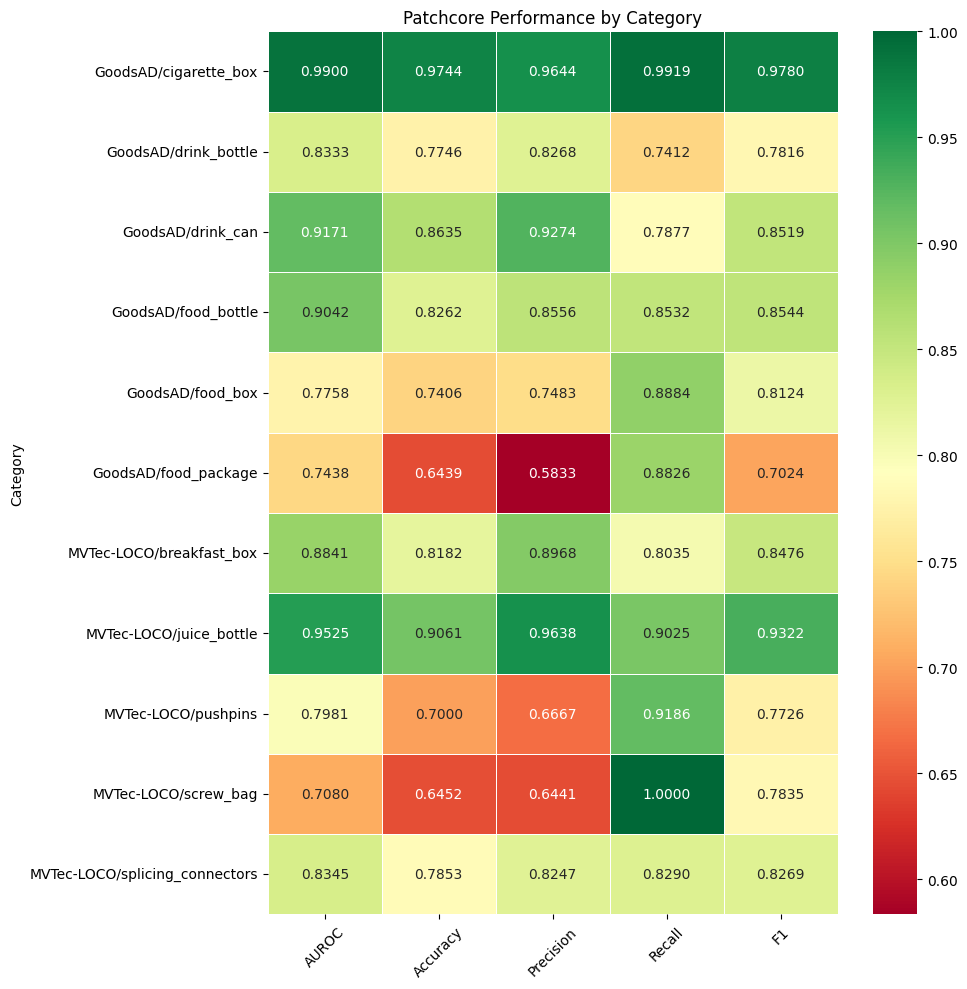

<Axes: title={'center': 'Patchcore Performance by Category'}, ylabel='Category'>

In [ ]:
from src.visual.plot import heatmap_plot

metrics_trans = metrics_df.drop('Average').drop(columns='N_samples')
heatmap_plot(
    metrics_trans,
    figsize=(10, 10),
    cmap='RdYlGn',
    annot=True,
    fmt='.4f',
    linewidths=0.5,
    title='Patchcore Performance by Category',
    rotation_x=45,
    rotation_y=0
)

Device: Tesla T4
Anomalibs initialized - model: patchcore, device: cuda
Categories: 5 | Filter: anomaly | Samples: 1

MVTec-LOCO / breakfast_box
  anomaly: 173 images → Selected: 1
  Inference: 42.9ms/image


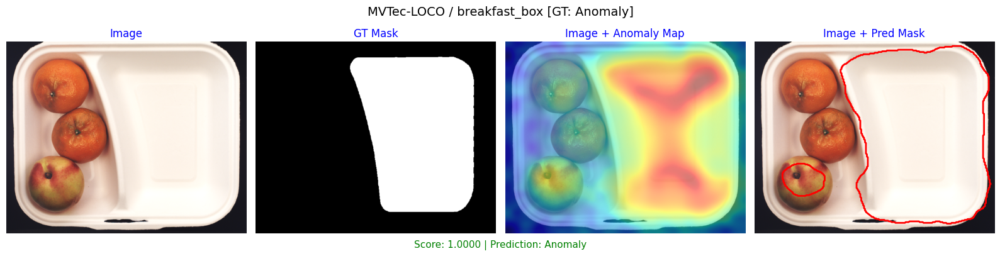


MVTec-LOCO / juice_bottle
  anomaly: 236 images → Selected: 1
  Inference: 41.1ms/image


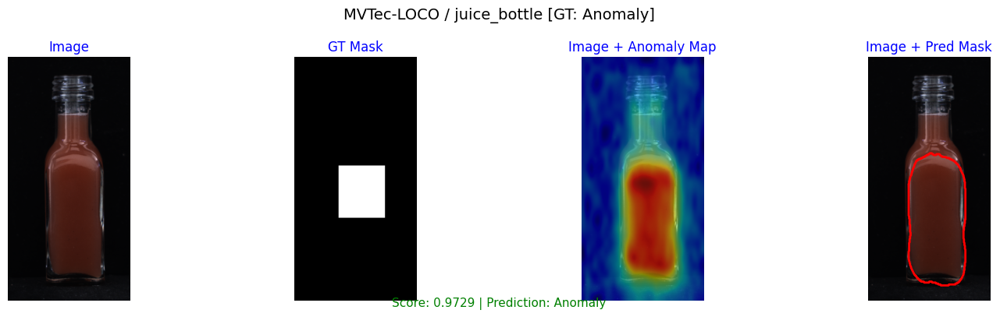


MVTec-LOCO / pushpins
  anomaly: 172 images → Selected: 1
  Inference: 44.3ms/image


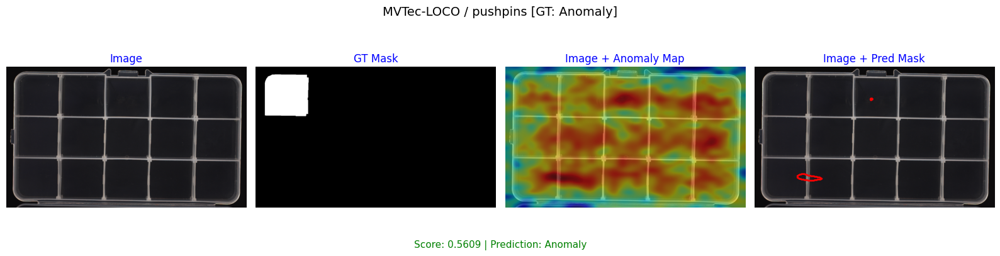


MVTec-LOCO / screw_bag
  anomaly: 219 images → Selected: 1
  Inference: 43.0ms/image


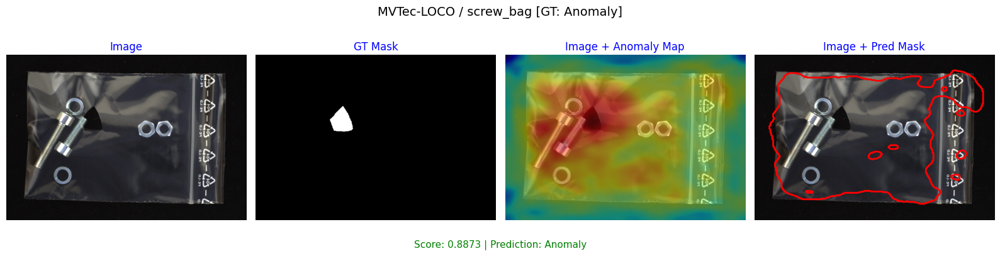


MVTec-LOCO / splicing_connectors
  anomaly: 193 images → Selected: 1
  Inference: 43.1ms/image


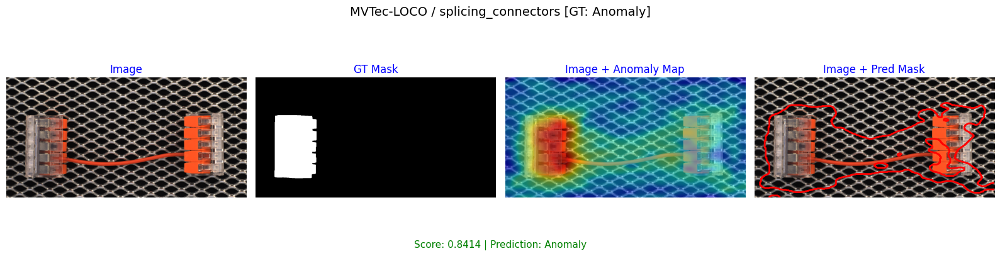

In [6]:
from scripts.train_anomalib import Anomalibs
from src.visual.plot import visualize_predictions_from_runner

runner = Anomalibs()
results = visualize_predictions_from_runner(
    runner,
    n_samples_per_category=1,
    filter_by="anomaly",      # "all", "anomaly", "normal"
    random_sample=True,       # 랜덤 샘플링
    show_inference_time=True,
)